In [8]:
import os
import cv2
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import random
import shutil
from PIL import Image

import seaborn as sns
sns.set(style='darkgrid')

import warnings
warnings.filterwarnings("ignore")

In [9]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [10]:
dataset_dir = "/content/drive/MyDrive/Original"
output_dir = "/content/drive/MyDrive/masked"
classes = ["Benign", "Early", "Pre", "Pro"]

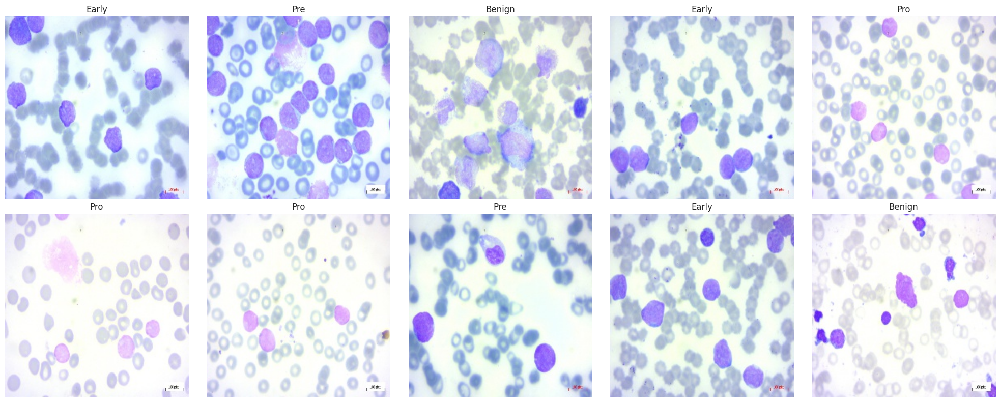

In [11]:
def load_images_from_class(class_name, num_images=3):
    class_dir = os.path.join(dataset_dir, class_name)
    image_files = os.listdir(class_dir)
    selected_files = random.sample(image_files, num_images)
    images = []
    for file in selected_files:
        image_path = os.path.join(class_dir, file)
        image = Image.open(image_path)
        images.append((image, class_name))
    return images

sample_images = []
for class_name in classes:
    sample_images.extend(load_images_from_class(class_name))

sample_images = random.sample(sample_images, 10)

fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.ravel()

for ax, (image, label) in zip(axes, sample_images):
    ax.imshow(image)
    ax.set_title(label)
    ax.axis('off')

plt.tight_layout()
plt.show()

In [12]:
def plot_steps(original_images, equalized_images, segmented_images, binary_images, cleaned_images, masked_images, class_name):
    num_images = len(original_images)
    fig, axes = plt.subplots(num_images, 6, figsize=(24, 5*num_images))
    fig.suptitle(f"\nProcessing Steps for Class: {class_name}", fontsize=16)

    for i in range(num_images):
        axes[i, 0].imshow(original_images[i])
        axes[i, 0].axis('off')
        axes[i, 0].set_title("Original")

        axes[i, 1].imshow(equalized_images[i])
        axes[i, 1].axis('off')
        axes[i, 1].set_title("Histogram Equalized")

        axes[i, 2].imshow(segmented_images[i], cmap='gray')
        axes[i, 2].axis('off')
        axes[i, 2].set_title("Segmented")

        axes[i, 3].imshow(binary_images[i], cmap='gray')
        axes[i, 3].axis('off')
        axes[i, 3].set_title("Binary Mask")

        axes[i, 4].imshow(cleaned_images[i], cmap='gray')
        axes[i, 4].axis('off')
        axes[i, 4].set_title("Cleaned")

        axes[i, 5].imshow(masked_images[i])
        axes[i, 5].axis('off')
        axes[i, 5].set_title("Masked")

    plt.tight_layout()
    plt.show()

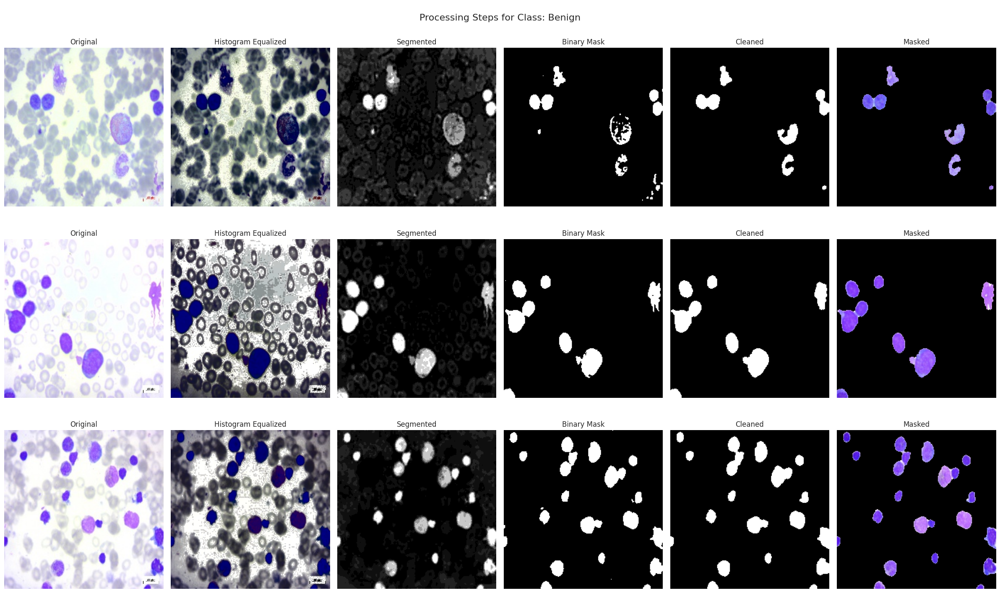

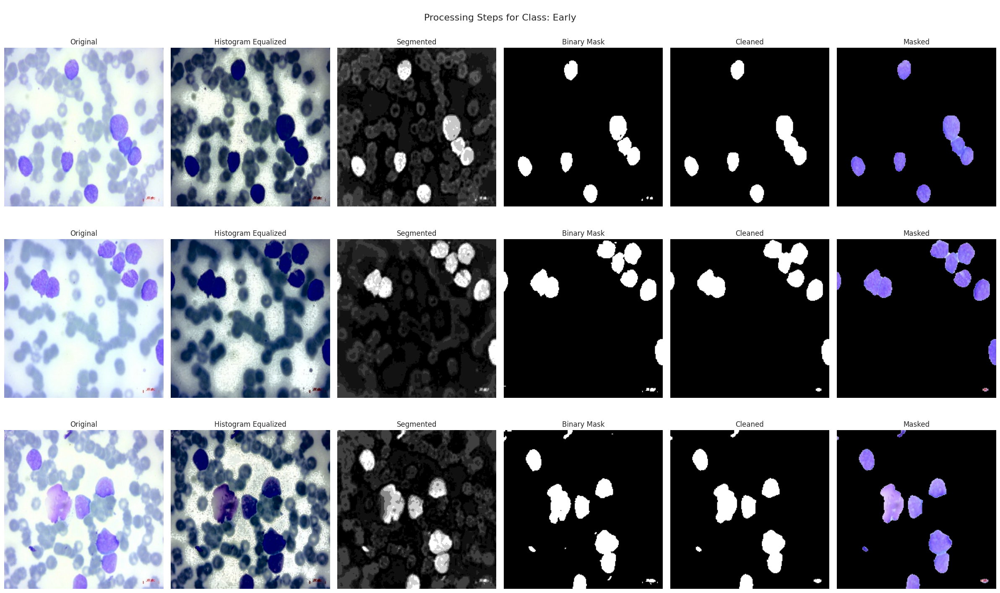

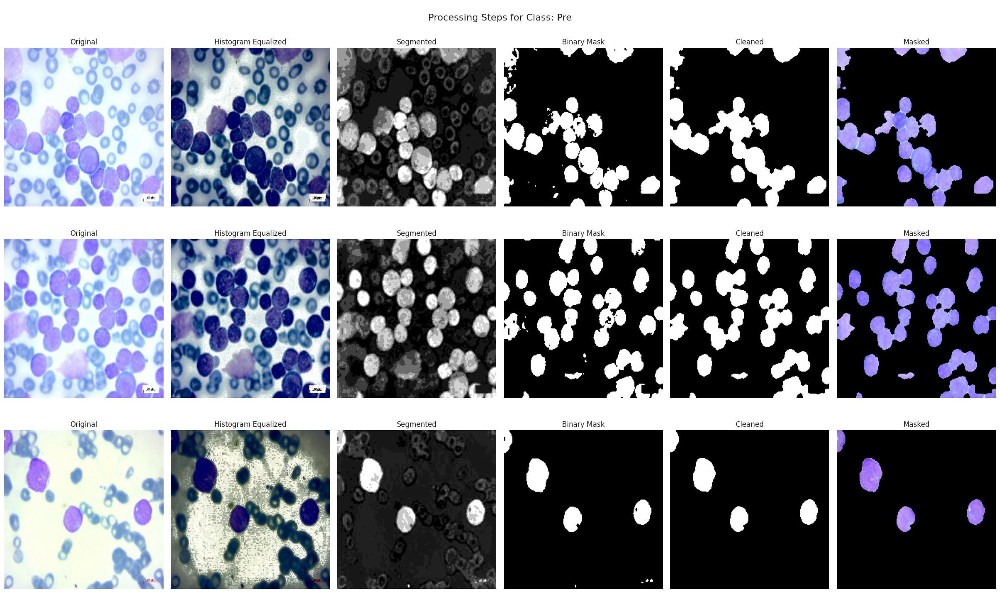

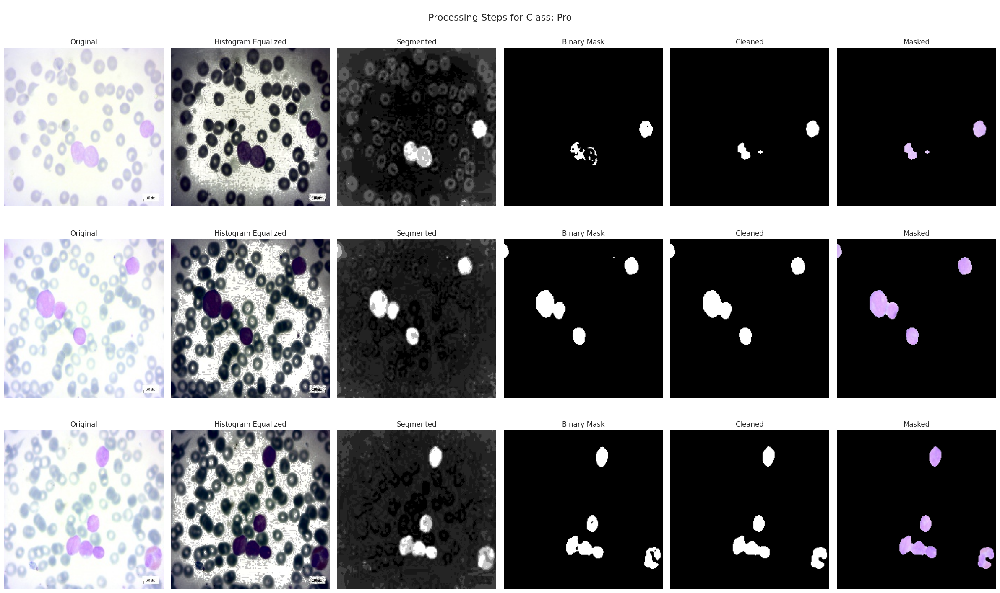

In [13]:
class_original_images = {cls: [] for cls in classes}
class_equalized_images = {cls: [] for cls in classes}
class_segmented_images = {cls: [] for cls in classes}
class_binary_images = {cls: [] for cls in classes}
class_cleaned_images = {cls: [] for cls in classes}
class_masked_images = {cls: [] for cls in classes}

for cls in classes:
    class_dir = os.path.join(dataset_dir, cls)
    class_images_files = os.listdir(class_dir)
    images_to_process = class_images_files[:3]

    for img_file in images_to_process:
        img_path = os.path.join(class_dir, img_file)
        img = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img_resized = cv2.resize(img_rgb, (224, 224))

        # Histogram Equalization
        img_equalized = cv2.cvtColor(img_resized, cv2.COLOR_RGB2LAB)
        l, a, b = cv2.split(img_equalized)
        l_equ = cv2.equalizeHist(l)
        img_equalized = cv2.merge((l_equ, a, b))
        img_equalized = cv2.cvtColor(img_equalized, cv2.COLOR_LAB2RGB)

        # KMeans Segmentation
        img_lab = cv2.cvtColor(img_resized, cv2.COLOR_RGB2LAB)
        l, a, b = cv2.split(img_lab)
        a_reshaped = a.reshape(-1, 1)
        kmeans = KMeans(n_clusters=7, random_state=0).fit(a_reshaped)
        cluster_centers = kmeans.cluster_centers_[kmeans.labels_]
        segmented_img = cluster_centers.reshape(a.shape[0], a.shape[1]).astype(np.uint8)

        # Thresholding
        _, binary_img = cv2.threshold(segmented_img, 145, 255, cv2.THRESH_BINARY)

        # Morphological Operations
        filled_img = cv2.morphologyEx(binary_img, cv2.MORPH_CLOSE, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5)))
        cleaned_img = cv2.morphologyEx(filled_img, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5)))

        # Masking
        masked_img = cv2.bitwise_and(img_resized, img_resized, mask=cleaned_img)

        # Store processed images
        class_original_images[cls].append(img_resized)
        class_equalized_images[cls].append(img_equalized)
        class_segmented_images[cls].append(segmented_img)
        class_binary_images[cls].append(binary_img)
        class_cleaned_images[cls].append(cleaned_img)
        class_masked_images[cls].append(masked_img)

for cls in classes:
    plot_steps(class_original_images[cls], class_equalized_images[cls], class_segmented_images[cls],
               class_binary_images[cls], class_cleaned_images[cls], class_masked_images[cls], cls)

In [14]:
def create_masked_dataset(dataset_dir, output_dir):
    for cls in classes:
        class_dir = os.path.join(dataset_dir, cls)
        output_cls_dir = os.path.join(output_dir, cls)
        os.makedirs(output_cls_dir, exist_ok=True)

        class_images_files = os.listdir(class_dir)

        for img_file in class_images_files:
            img_path = os.path.join(class_dir, img_file)
            img = cv2.imread(img_path)
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img_resized = cv2.resize(img_rgb, (224, 224))

            # KMeans Segmentation
            img_lab = cv2.cvtColor(img_resized, cv2.COLOR_RGB2LAB)
            l, a, b = cv2.split(img_lab)
            a_reshaped = a.reshape(-1, 1)
            kmeans = KMeans(n_clusters=7, random_state=0).fit(a_reshaped)
            cluster_centers = kmeans.cluster_centers_[kmeans.labels_]
            segmented_img = cluster_centers.reshape(a.shape[0], a.shape[1]).astype(np.uint8)

            # Thresholding
            _, binary_img = cv2.threshold(segmented_img, 145, 255, cv2.THRESH_BINARY)

            # Morphological Operations
            filled_img = cv2.morphologyEx(binary_img, cv2.MORPH_CLOSE, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5)))
            cleaned_img = cv2.morphologyEx(filled_img, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5)))

            # Masking
            masked_img = cv2.bitwise_and(img_resized, img_resized, mask=cleaned_img)

            output_img_path = os.path.join(output_cls_dir, img_file)
            cv2.imwrite(output_img_path, cv2.cvtColor(masked_img, cv2.COLOR_RGB2BGR))

    print("Dataset of masked images created successfully.")

In [15]:
create_masked_dataset(dataset_dir, output_dir)

Dataset of masked images created successfully.


In [16]:
def visualize_masked_images(output_dir, classes):
    for cls in classes:
        class_dir = os.path.join(output_dir, cls)
        image_files = os.listdir(class_dir)

        random_img_files = random.sample(image_files, 3)

        plt.figure(figsize=(16, 10))
        for i, img_file in enumerate(random_img_files, 1):
            sample_img_path = os.path.join(class_dir, img_file)
            sample_img = cv2.imread(sample_img_path)
            sample_img = cv2.cvtColor(sample_img, cv2.COLOR_BGR2RGB)
            plt.subplot(2, 3, i)
            plt.imshow(sample_img)
            plt.title(f"Sample {i}")
            plt.axis('off')
        plt.suptitle(f"Random Sample Masked Images ({cls})", fontsize=16)
        plt.show()

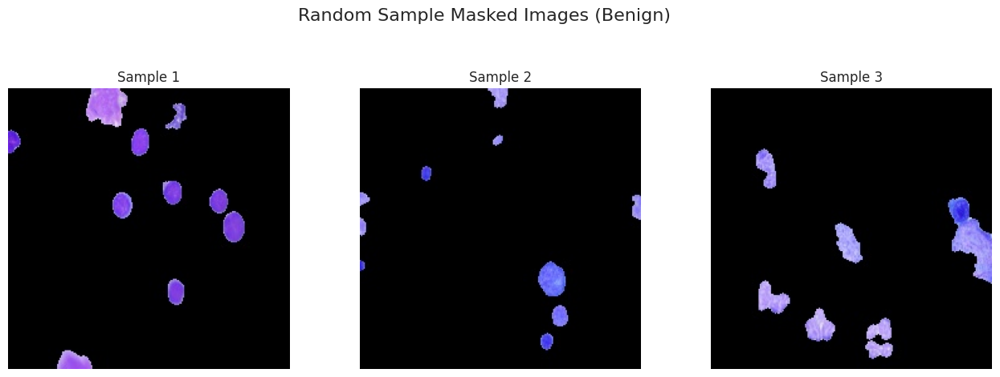

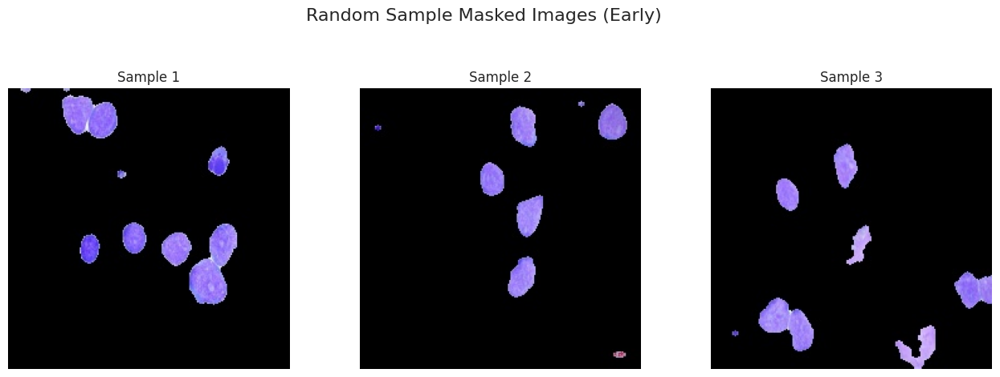

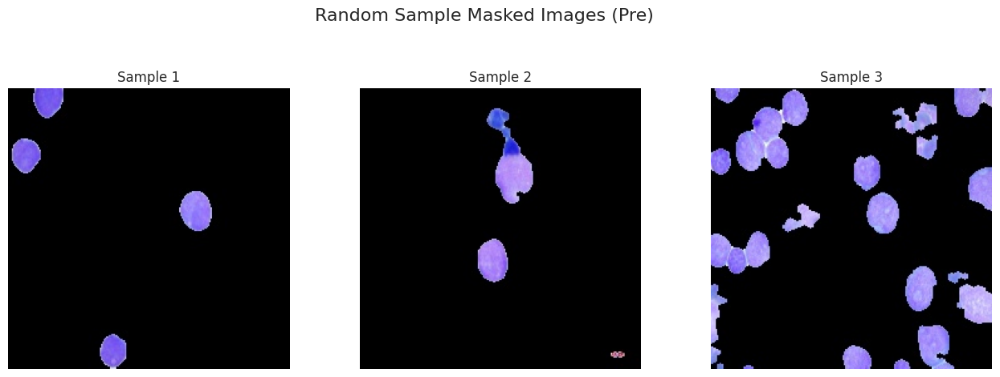

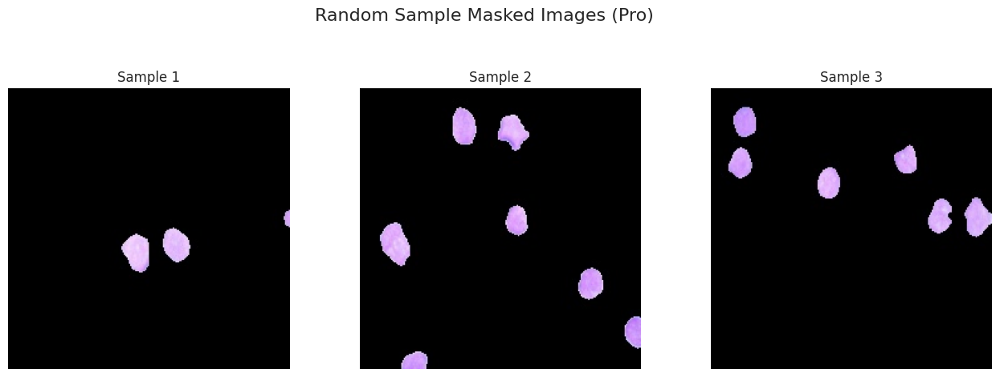

In [17]:
visualize_masked_images(output_dir, classes)

In [18]:
def visualize_class_counts(output_dir, classes):
    sns.set_palette('Pastel1')
    colors = sns.color_palette()

    class_counts = {}

    for cls in classes:
        class_dir = os.path.join(output_dir, cls)
        if os.path.exists(class_dir):
            class_counts[cls] = len(os.listdir(class_dir))
        else:
            class_counts[cls] = 0

    plt.figure(figsize=(10, 6))
    bars = plt.bar(class_counts.keys(), class_counts.values(), color=colors)
    plt.xlabel('Classes')
    plt.ylabel('Number of Images')
    plt.title('Number of Images per Class in the Masked Dataset')
    plt.xticks(rotation=45)
    plt.grid(axis='y')

    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2.5, yval, int(yval), va='bottom')

    plt.show()

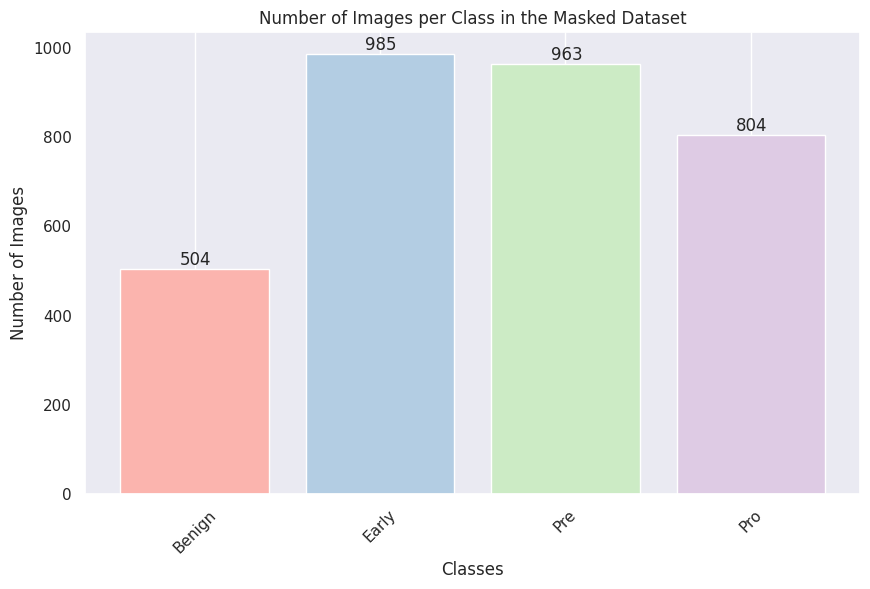

In [19]:
visualize_class_counts(output_dir, classes)